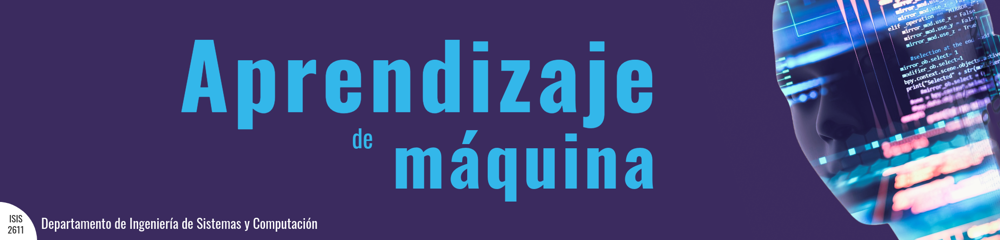

# Segmentación de Imágenes con K-Means

En la práctica anterior se analizó una de las aplicaciones más frecuentes de los algoritmos de agrupación: el perfilamiento de usuarios mediante la identificación de patrones en sus datos para mejorar su experiencia y encontrar oportunidades de mercadeo. Sin embargo, este notebook tiene como objetivo explorar otro caso de uso dentro del área de la visión por computadora. Específicamente, cómo aplicar el algoritmo K-Means para la segmentación de imágenes.

Las imágenes digitales se representan típicamente como arreglos de dimensiones $H \times W \times C$, donde $H$ y $W$ corresponden a la altura y anchura en píxeles, mientras que $C$ denota los canales de color (usualmente 3 para el espacio *RGB*). Para abordar la segmentación como un problema de agrupamiento, la estructura se transforma en un conjunto de datos de tamaño $(H \cdot W) \times C$. En este nuevo espacio, los valores de color de cada píxel actúan como coordenadas en $\mathbb{R}^3$, permitiendo que los algoritmos identifiquen patrones basados en la intensidad y similitud cromática.

Para ello, se han seleccionado diez imágenes de manera arbitraria. El objetivo es analizar la aplicación de esta técnica y evaluar la calidad de los resultados que el algoritmo es capaz de producir en diferentes escenarios.



A continuación, se llevará a cabo una exploración del conjunto de imágenes para, posteriormente, proceder con el entrenamiento y la evaluación de los modelos de segmentación.

Para ello este notebook se divide en:

1. Importación de librerías.
2. Carga de datos.
3. Exploración de datos.
4. Selección de imagen.
5. Entrenamiento y evaluación.
6. Ejercicios

## 0. Instalación de librerías

In [ ]:
# Si no tienes la linería OpenCV instalada debes primero ejecutar este paso:
# pip install opencv-python

## 1. Importación de librerías

In [1]:
import os
import cv2

import numpy as np
from glob import glob

import plotly.graph_objects as go
from matplotlib import pyplot as plt

from sklearn.cluster import KMeans

## 2. Carga de datos.

Las imágenes se encuentran en el directorio `/data`, por lo que se recuperan las rutas de los archivos contenidos en dicha carpeta para cargarlos en memoria.

In [8]:
img_paths = sorted(glob(os.path.join('.', 'data', '*.jpg')))

In [9]:
def load_imgs(paths):
  imgs = []
  for path in paths:
    imgs.append(cv2.imread(path, cv2.IMREAD_COLOR_RGB))
  return imgs

In [10]:
imgs = load_imgs(img_paths)

## 3. Exploración de datos


Una vez con los datos cargados, se procede a explorarlos con el fin de observar su estructura y distribución:

In [11]:
len(imgs)

10

Se comprueba que los datos contienen tan solo diez imágenes. De manera que, al tratarse de un conjunto bastante pequeño, se procede a visulizarlas.

In [12]:
def show_imgs(imgs, title):
  cols = len(imgs)//2
  rows = len(imgs)//cols


  fig, ax = plt.subplots(rows, cols, layout='tight', figsize=(12, 8))

  img_idx = 0
  for i in range(rows):
    for j in range(cols):
      ax[i, j].imshow(imgs[img_idx])
      ax[i, j].axis('off')

      img_idx += 1

  plt.suptitle(title)
  plt.show()

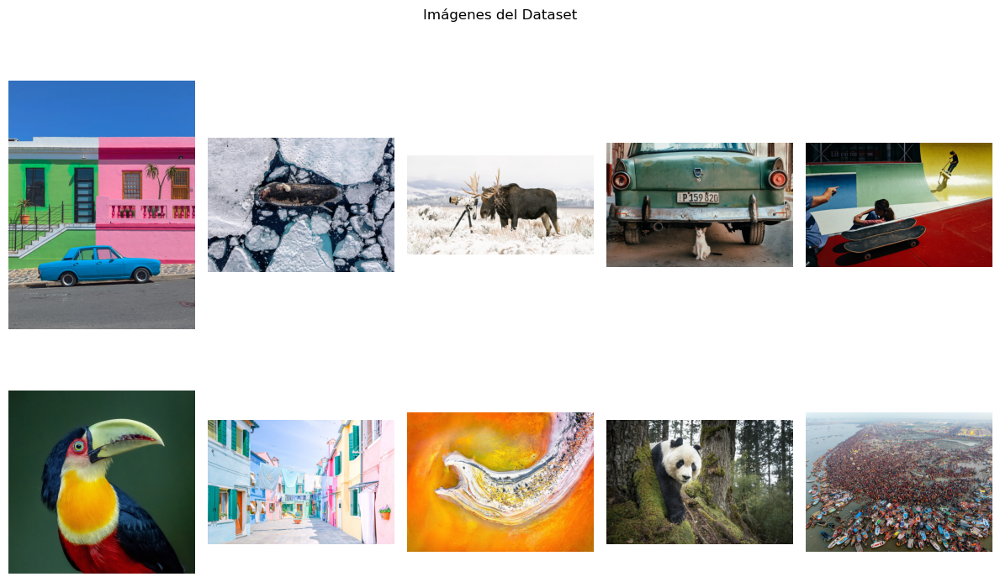

In [13]:
show_imgs(imgs, 'Imágenes del Dataset')

Se observa que el conjunto consiste en una colección diversa de imágenes que cubren distintas áreas del espectro cromático. Esta variedad resulta ideal para poner a prueba los modelos de agrupación ante diferentes distribuciones de color.

## 4. Selección de imagen.



Dado que el objetivo es analizar la respuesta del modelo ante cada imagen individual, el entrenamiento se realizará píxel a píxel por cada imagen, en lugar de utilizar el conjunto completo. No obstante, en dominios donde las imágenes comparten una misma distribución cromática, puede que sea preferible entrenar el modelo sobre todo el conjunto.

Debido a ello se selecciona una imagen de forma aleatoria, sin embargo, también es posible seleccionar una imágen en particualr si es que se desea explorarla.

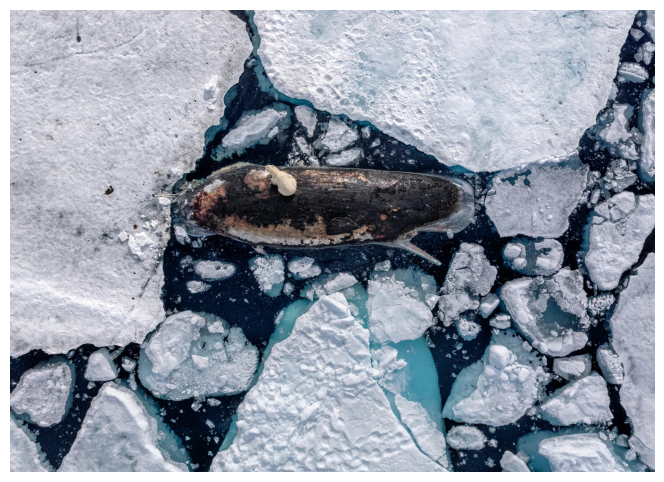

In [14]:
img_idx = np.random.choice(len(imgs)) # Reemplazar por el índice de la imagen que se desea utilizar
img = imgs[img_idx]

fig, ax = plt.subplots(figsize=(10, 6))
ax.imshow(img)
ax.axis('off')

plt.show()

In [15]:
def plot_data(img, pct=0.01):

    X = img.reshape(-1, 3)
    X_idx_sample = np.random.choice(len(X), round(len(X)*pct), replace=False)
    X_sample = X[X_idx_sample]

    r, g, b = X_sample[:, 0], X_sample[:, 1], X_sample[:, 2]
    colors = [f'rgb({r},{g},{b})' for r, g, b in X_sample]

    fig = go.Figure(data=[go.Scatter3d(
        x=r, y=g, z=b,
        mode='markers',
        marker=dict(
            size=2,
            color=colors,
            opacity=0.8
        )
    )])


    fig.update_layout(
        margin=dict(l=0, r=0, b=0, t=0), # Tight layout
        scene=dict(xaxis_title='R', yaxis_title='G', zaxis_title='B')
    )

    fig.show()

Tras seleccionar una imagen, se procede a visualizar su distribución en el espacio RGB. El objetivo es analizar la morfología del conjunto de datos mediante una gráfica interactiva que permita identificar cómo se agrupan los colores.

In [16]:
plot_data(img)

Se observa que la distribución del conjunto es considerablemente anisotrópica. Al presentar agrupaciones que no siguen una distribución normal, los datos adquieren formas complejas que, a simple vista, representan un desafío para los algoritmos de clustering tradicionales.

## 5. Entrenamiento y evaluación.

### Segmentación por color

Para la segmentación, se ejecutará el algoritmo K-Means y se generará una nueva imagen donde cada píxel adoptará el color del centroide de su clúster asignado. Este procedimiento se repetirá variando el valor de $K$, lo que permitirá evaluar cualitativamente el impacto de este hiperparámetro en el resultado de la segmentación.

In [17]:
def img_segmentation(img, k_vals):

  X = img.reshape((-1, 3))

  segmented_imgs = np.zeros((len(k_vals), *img.shape), dtype=np.uint8)
  kmeans_list = []

  for i, k in enumerate(k_vals):

    kmeans = KMeans(n_clusters=k)
    cluster_labels = kmeans.fit_predict(X)
    segmented_pixels = kmeans.cluster_centers_[cluster_labels]
    segmented_img = segmented_pixels.reshape(img.shape)
    segmented_imgs[i] = segmented_img
    kmeans_list.append(kmeans)

  return segmented_imgs, kmeans_list

c:\Users\pifbl\anaconda3\Lib\site-packages\joblib\externals\loky\backend\context.py:136: UserWarning:

Could not find the number of physical cores for the following reason:
[WinError 2] El sistema no puede encontrar el archivo especificado
Returning the number of logical cores instead. You can silence this warning by setting LOKY_MAX_CPU_COUNT to the number of cores you want to use.

  File "c:\Users\pifbl\anaconda3\Lib\site-packages\joblib\externals\loky\backend\context.py", line 257, in _count_physical_cores
    cpu_info = subprocess.run(
        "wmic CPU Get NumberOfCores /Format:csv".split(),
        capture_output=True,
        text=True,
    )
  File "c:\Users\pifbl\anaconda3\Lib\subprocess.py", line 554, in run
    with Popen(*popenargs, **kwargs) as process:
         ~~~~~^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\pifbl\anaconda3\Lib\subprocess.py", line 1039, in __init__
    self._execute_child(args, executable, preexec_fn, close_fds,
    ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^

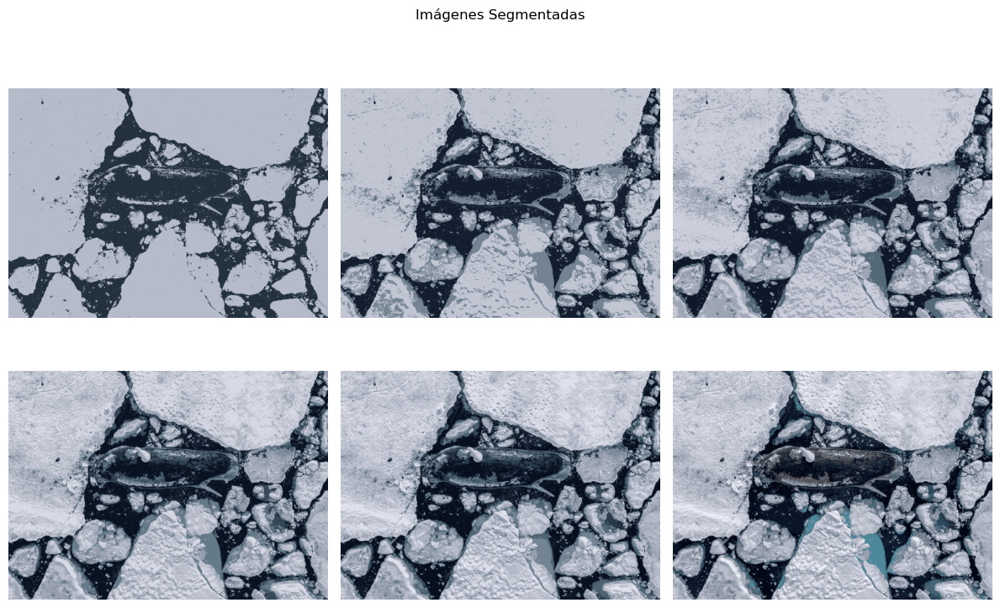

In [18]:
k_vals = [2, 3, 4, 6, 8, 16]
segmented_imgs, kmeans_list = img_segmentation(img, k_vals)
show_imgs(segmented_imgs, 'Imágenes Segmentadas')

Este proceso genera imágenes que mantienen su estructura original con una paleta de colores simplificada. Es notable como, al superar un valor de $K=8$, la fidelidad es tal que los cambios apenas se perciben a simple vista. Esto abre la puerta a usos prácticos como la compresión mediante cuantización o la creación de representaciones simplificadas para otros algoritmos de visión artificial. Sin embargo, en un contexto donde la capacidad de cómputo ya no es una limitación crítica, esta técnica destaca hoy por su valor estético y artístico.

In [19]:
def elbow_plot(kmeans_list):

    k_vals = []
    inertia_vals = []
    for kmeans in kmeans_list:
      k_vals.append(kmeans.n_clusters)
      inertia_vals.append(kmeans.inertia_)

    plt.plot(k_vals, inertia_vals, marker='o')
    plt.xlabel('Número de clústeres')
    plt.ylabel('Inercia')
    plt.title('Método del Codo')
    plt.grid()
    plt.show()

    return inertia_vals, k_vals

Para profundizar en el análisis desde una perspectiva cuantitativa, es posible emplear las métricas de evaluación estudiadas previamente. Métodos como el método del codo o el coeficiente de silueta permiten realizar la selección del hiperparámetro $K$ basándose en la estructura interna de los datos, más allá de la inspección visual.

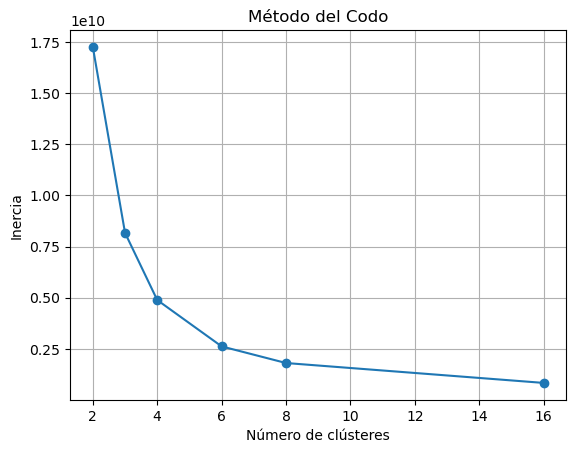

In [20]:
inertia_vals, k_vals = elbow_plot(kmeans_list)

Con el fin de automatizar la elección de $K$, buscamos el 'codo' de la gráfica determinando su cambio de pendiente más brusco. Para ello, calculamos el máximo del valor absoluto de la segunda derivada de la inercia. Este valor nos indica el punto donde añadir más clústeres deja de aportar una mejora significativa.

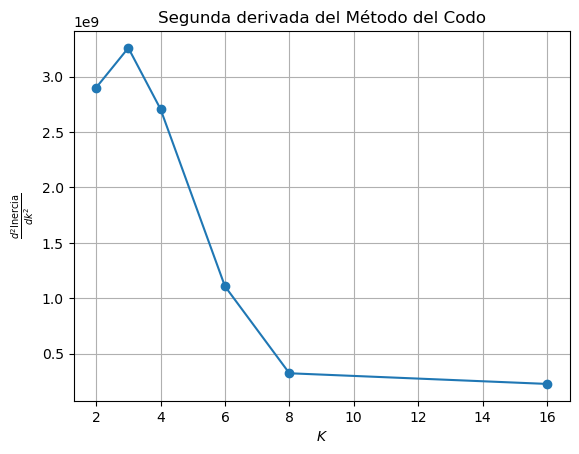

In [21]:
ddinertia = np.gradient(np.gradient(np.abs(inertia_vals), k_vals))

plt.plot(k_vals, ddinertia, marker='o')
plt.xlabel('$K$')
plt.ylabel(r'$\frac{d^2 \text{Inercia}}{dk^2}$')
plt.title('Segunda derivada del Método del Codo')
plt.grid()
plt.show()

In [22]:
optimal_k =  k_vals[np.argmax(ddinertia)]
optimal_k

3

Finalmente, tras determinar el valor óptimo de $K$, se procede a graficar nuevamente la distribución de los datos. Esta visualización permite contrastar los clústeres generados con la estructura original de los píxeles, facilitando la interpretación geométrica de la segmentación obtenida.

In [23]:
def plot_seg_data(img, k, pct=0.01):

    X = img.reshape(-1, 3)

    kmeans = KMeans(n_clusters=k)
    cluster_labels = kmeans.fit_predict(X)
    segmented_pixels = kmeans.cluster_centers_[cluster_labels]


    X_idx_sample = np.random.choice(len(X), round(len(X)*pct), replace=False)
    X_sample = X[X_idx_sample]
    segmented_sample = segmented_pixels[X_idx_sample]

    r, g, b = X_sample[:, 0], X_sample[:, 1], X_sample[:, 2]

    colors = [f'rgb({r},{g},{b})' for r, g, b in segmented_sample]

    fig = go.Figure(data=[go.Scatter3d(
        x=r, y=g, z=b,
        mode='markers',
        marker=dict(
            size=2,
            color=colors,
            opacity=0.8
        )
    )])

    fig.update_layout(
        margin=dict(l=0, r=0, b=0, t=0), # Tight layout
        scene=dict(xaxis_title='R', yaxis_title='G', zaxis_title='B')
    )

    fig.show()

In [24]:
plot_seg_data(img, optimal_k)

Se observa que K-Means identifica los $K$ clústeres más representativos de la distribución mediante centroides cromáticamente diferenciados. No obstante, la morfología del espacio revela fronteras abruptas en regiones densas que podrían pertenecer a un mismo conjunto. Esto evidencia las limitaciones del algoritmo al imponer una partición rígida sobre los datos y destaca su sesgo hacia la identificación de conjuntos convexos.

### Segmentación por color y espacio

La segmentación anterior demuestra que K-Means identifica eficazmente los colores predominantes de una imagen. No obstante, evidencia que estos no poseen una correlación espacial intrínseca. Para aplicaciones prácticas, esta es una debilidad crítica, ya que la información estructural suele ser más relevante que la cromática. Por ejemplo, en una radiografía, distintos huesos pueden presentar la misma intensidad de color y recibir la misma etiqueta, a pesar de ser entidades anatómicas independientes.

Debido a las limitaciones mencionadas, resulta conveniente integrar información espacial en la representación de los píxeles. Bajo una metodología similar a la anterior, cada píxel se define por sus valores RGB, pero extendiendo el vector original con sus coordenadas cartesianas $(i,j)$. Esto genera un conjunto de datos en $\mathbb{R}^5$ que combina información cromática y espacial, permitiendo al algoritmo considerar la proximidad física de los píxeles.

En el siguiente ejemplo, se realizará la segmentación del vehículo en la imagen `0.jpg`. El procedimiento se llevará a cabo en dos etapas: primero, utilizando únicamente la información cromática y, posteriormente, integrando la información espacial. Esto permitirá demostrar el impacto que tiene la inclusión de las coordenadas en la precisión del modelo.

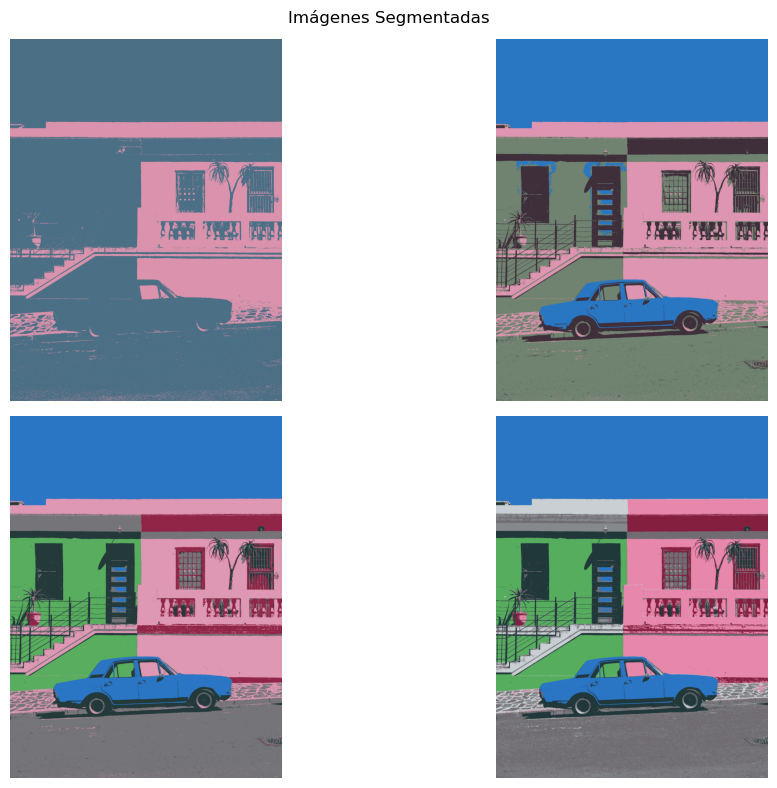

In [25]:
k_vals = [2, 4, 6, 8]
segmented_imgs, kmeans_list = img_segmentation(imgs[0], k_vals)
show_imgs(segmented_imgs, 'Imágenes Segmentadas')

Con base a la visualización de las imágenes se determina que con $K=4$ es posible segmentar el vehículo.

In [26]:
def get_img_masks(img, k, weight = 0.17):
  I, J = np.meshgrid(np.arange(img.shape[0]), np.arange(img.shape[1]), indexing='ij')
  idx_list = np.dstack([I, J]).reshape(-1, 2)

  X = img.reshape((-1, 3))
  X = np.hstack([X, idx_list*weight])

  kmeans = KMeans(n_clusters=k, random_state=2)
  cluster_labels = kmeans.fit_predict(X)

  segmented_img = cluster_labels.reshape(img.shape[:2])

  cols = k//2
  rows = k//cols

  fig, ax = plt.subplots(rows, cols, layout='tight', figsize=(10, 6))

  img_idx = 0

  for i in range(rows):
    for j in range(cols):

      mask = (segmented_img == img_idx)
      ax[i, j].imshow(mask)
      ax[i, j].axis('off')
      ax[i, j].set(title=f'Label = {img_idx}')

      img_idx += 1

  plt.show()

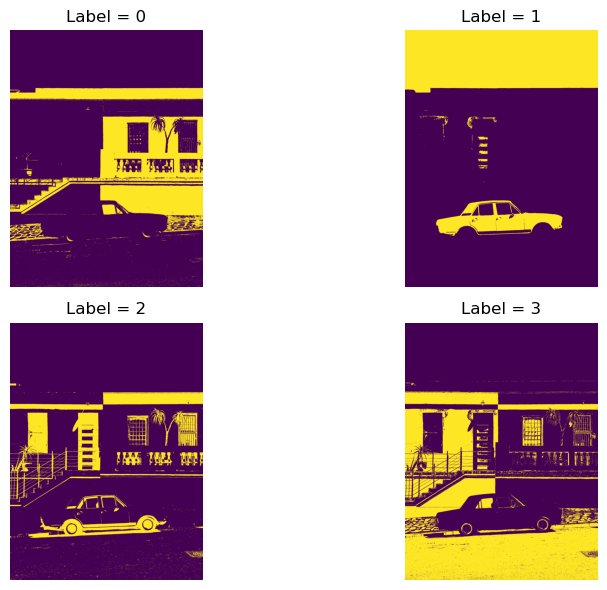

In [27]:
segmented_img = get_img_masks(imgs[0], 4, 0)

Las máscaras obtenidas demuestran que el algoritmo segmenta el vehículo correctamente. No obstante, también incluye áreas del cielo que poseen un color similar. Este resultado sugiere que el método tiene una alta cobertura, pero una baja precisión. Para mitigar este problema, se procederá a integrar las coordenadas espaciales en la representación de los píxeles, buscando diferenciar regiones cromáticamente similares pero espacialmente distantes.

In [28]:
def spatial_img_segmentation(img, k_vals, weight = 0.17):
  I, J = np.meshgrid(np.arange(img.shape[0]), np.arange(img.shape[1]), indexing='ij')
  idx_list = np.dstack([I, J]).reshape(-1, 2)

  X = img.reshape((-1, 3))
  X = np.hstack([X, idx_list*weight])

  segmented_imgs = np.zeros((len(k_vals), *img.shape), dtype=np.uint8)

  for i, k in enumerate(k_vals):

    kmeans = KMeans(n_clusters=k, random_state=2)
    cluster_labels = kmeans.fit_predict(X)
    segmented_pixels = kmeans.cluster_centers_[cluster_labels]

    segmented_img = segmented_pixels[:, :3].reshape(img.shape)
    segmented_imgs[i] = segmented_img

  return segmented_imgs

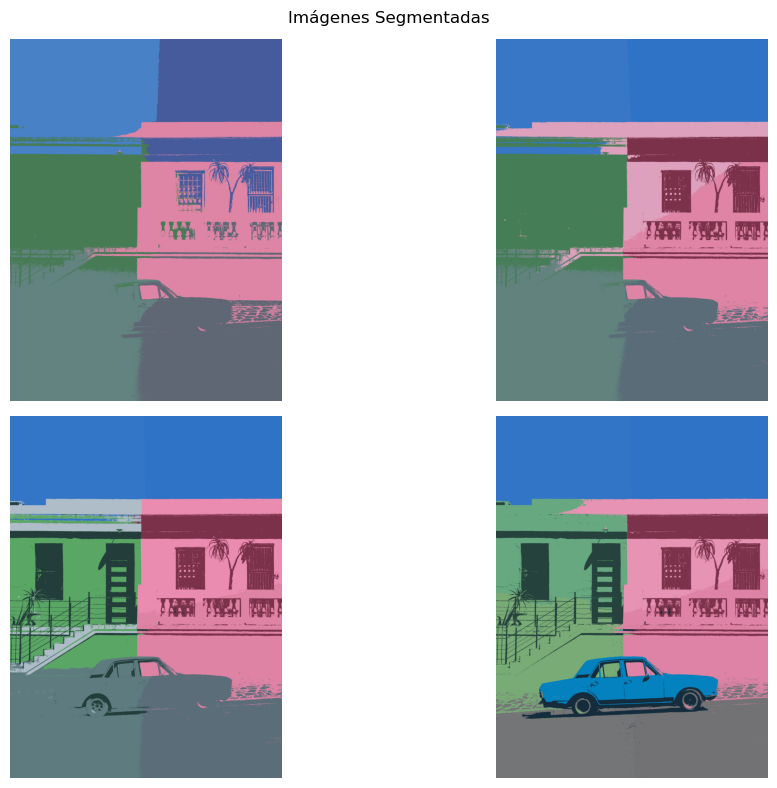

In [29]:
k_vals = [6, 8, 10, 12]
segmented_imgs = spatial_img_segmentation(imgs[0], k_vals)
show_imgs(segmented_imgs, 'Imágenes Segmentadas')

Se determina que con $K = 12$ es posible segmentar al vehículo. Por lo que se procede a extraer las máscaras de segmentación.

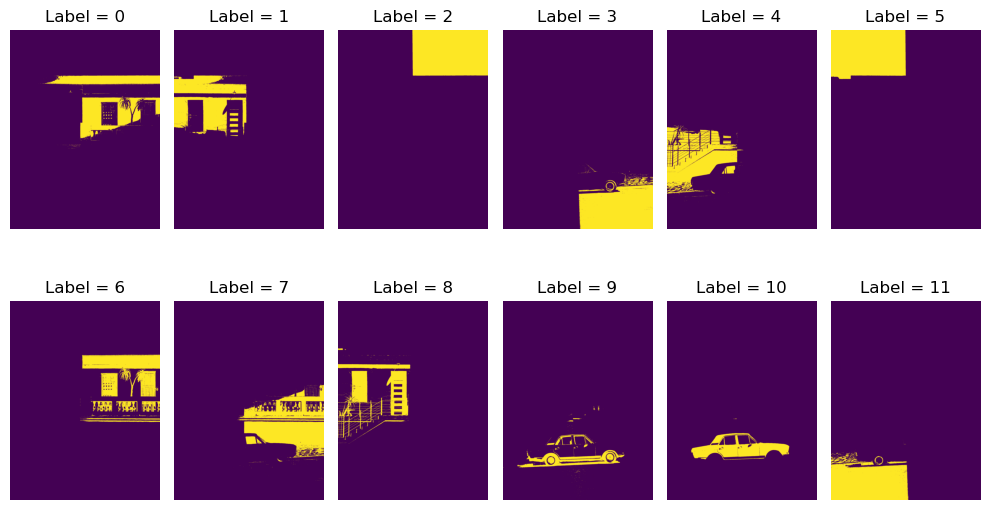

In [30]:
segmented_img = get_img_masks(imgs[0], 12)

Al visualizar las máscaras de segmentación, no solo se observa que la mayoría del vehículo ha sido segmentado en una de ellas, sino que también lo ha hecho gran precisión, obteniendo un buen balance entre precisión y cobertura. Este resultado confirma la relevancia de integrar características espaciales en tareas de visión por computador.

## 6. Ejercicios

+ **Ejercicio 1**. A lo largo de esta práctica, las imágenes se procesaron en el espacio de color RGB. Sin embargo, existen otros espacios de color alternativos. Investigue sobre otras representaciones del color y analice cómo estas podrían resultar beneficiosas o perjudiciales para el rendimiento del algoritmo K-Means en tareas de segmentación. Posteriormente, valide sus conclusiones segmentando un objeto de su interés en el conjunto de datos, utilizando el espacio de color seleccionado.

+ **Ejercicio 2**. Se ha demostrado que el algoritmo K-Means presenta un fuerte sesgo hacia los conjuntos convexos. Sin embargo, las gráficas de distribución revelan que la morfología de las imágenes no siempre cumple con esta propiedad. Investigue otros métodos de agrupamiento que no presenten esta limitación y aplíquelos sobre una imagen del conjunto de datos. ¿De qué manera se transforman los resultados al utilizar algoritmos que no dependen de la convexidad?

+ **Ejercicio 3**. Un detalle que puede pasar desapercibido es el parámetro `weight` utilizado en las funciones `spatial_img_segmentation` y `get_img_masks`. Analice nuevamente el código y describa qué efecto tiene este sobre los resultados. Posteriormente, experimente modificando su valor y visualice qué ocurre cuando se asignan valores extremos (muy grandes o muy pequeños). Describa sus hallazgos.